## Data Science project 2022

In this project, we will attempt to create a machine learning model, which predicts the bike traffic crossing Nygårdsbroen in Bergen, Norway at a given time based on the conditions. 

Before starting, we need to consider some questions.

Point 1: What is the question?

Point 2: What sort of data can be used to answer the question?

Point 3: What can we compare with?

Point 4: What are the ethical questions?

Looking at the first point, the main question is to what extent can we predict bike traffic crossing Nygårdsbroen based on the conditions. This is our main objective.

Here, we can answer some sub-questions:

1: What are we trying to find out?

We are trying to find the best possible model for predicting the cycling frequency.

2: What are the expectations, requirements, resources?

We are expected to complete a data science process, and the accuracy of the model is not the most important. We are given various resources in the raw data to work from, and various python libraries, which we will make use of.

3: What data is available, where did it come from, and what do they describe?

We have access to traffic data and cycling data. The traffic data comes from Statens Vegvesen and the weather data comes from Geofysisk institutt. The data describes the quantity of bikes over the bridge alongside other characteristics. The weather data describes various climate conditions in certain intervals. I will go more in depth later.

4: How do we measure if the project is successful?

If we can make the model predict the data well, then that is a good success. This can be measured via RMSE. More about this later. A successful project also describes the process well and the report needs to make sense. 

For the second point, we are given various files that include traffic and the weather conditions. This can assist us in creating the model. We could use other weather categories such as precipitation, but our data seems to be sufficient.

Some sub-questions for point 2:

1: Is it publically-available data or does data need to be gathered?

The data we're given is publically available. I assume that data regarding traffic and weather can be accessed publically.

2: Is there related data that I can use to answer the question?

It may be possible to get extra data in order to answer the question, such as precipitation data.

3: How much data do I need to answer the question?

The amount of data needed depends on the measurements. Our given data is time-based, so it would be useful to have lots of data that can iterate over these times. For instance, since months are periodic, it is ideal that our data spans years, so it can recognise patterns or trends.


For point three, we can compare with publically available data on the bike traffic in the file already given to us, such as in validation and test data, when we split the data. More on this later.

Sub-questions for point 3:

1: What should be done if we don't have data?

If we don't have data, then we need to gather data ourselves from various sources. If we're missing data, then there are various strategies to manage that. More on this later.

2: Can we use this to evaluate our project?

We split data for this purpose. Validating and testing data allows us to evaluate the efficacy of our model. We can even possibly test models on sources other than the ones provided to us.

Point four is slightly complicated, as there are not many ethical concerns that immediately appear. We are not gathering private data of individuals, and nor is this likely to cause significant harm to others in the event that this model fails.

Sub-questions for point 4:

1: Can this hurt someone?

This is unlikely to cause major harm if it fails. One could argue that if someone goes out in bad weather and it is unpleasant, it is a form of harm, but nothing major.

2: Are we gathering personal data?

We are not gathering personal data of individuals, but we are tracking bikes, which could be a form of surveillance depending on how one perceives it.

3: What happens if our answers are wrong?

Aside from people experiencing poor weather conditions, bike traffic could also bother them if the prediction was wrong, as people may prefer less bike traffic.

4: Can the answers be wrong in a discriminatory way?

Not really, as our data does not consider traits of individuals.

## Gathering and handling data: Cleaning weather data

We can now move on to data management. We will need tools in order to gather and handle the data given. Numpy and Pandas are key modules when it comes to handling large quantities of data. We also will use Plotly to graph and visualise data. Sklearn has many modules for data analysis, but for now, we will use Sklearn to split data into training, validation, and test data. This comes a bit later.

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

Looking at the weather data, we're given data from as far back as 2010. Let's start with data from 2015, as we are given traffic data starting from July 2015, so any weather data prior to that has no use for us.

In [2]:
wd2015 = pd.read_csv('raw_data/Florida_2015-01-01_2016-01-01_1654174882.csv')
traffic_data = pd.read_csv('raw_data/trafikkdata.csv', sep=';')

# As the traffic data starts July 16, we can modify the weather data for 2015 to only have data starting on that date
wd2015 = wd2015[wd2015.Dato > '2015-07-15']

C:\Users\kavya\AppData\Local\Temp\ipykernel_69416\1446874660.py:2: DtypeWarning: Columns (9,14) have mixed types. Specify dtype option on import or set low_memory=False.
  traffic_data = pd.read_csv('raw_data/trafikkdata.csv', sep=';')


We would ideally like to combine the weather data into a single dataframe for simplicity reasons, as we want to combine this with the traffic data as well.

In [3]:
# wd = weather data
wd2016 = pd.read_csv('raw_data/Florida_2016-01-01_2017-01-01_1654174902.csv')
wd2017 = pd.read_csv('raw_data/Florida_2017-01-01_2018-01-01_1654174925.csv')
wd2018 = pd.read_csv('raw_data/Florida_2018-01-01_2019-01-01_1654175073.csv')
wd2019 = pd.read_csv('raw_data/Florida_2019-01-01_2020-01-01_1654174955.csv')
wd2020 = pd.read_csv('raw_data/Florida_2020-01-01_2021-01-01_1654174973.csv')
wd2021 = pd.read_csv('raw_data/Florida_2021-01-01_2022-01-01_1654174989.csv')
wd2022 = pd.read_csv('raw_data/Florida_2022-01-01_2022-06-01_1654175011.csv')


# We can merge these into one dataframe via the concat method of pandas
wd_total = pd.concat([wd2015, wd2016, wd2017, wd2018, wd2019, wd2020, wd2021, wd2022])

wd_total

,Dato,Tid,Globalstraling,Solskinstid,Lufttemperatur,Vindretning,Vindstyrke,Lufttrykk,Vindkast
28224,2015-07-16,00:00,0.1,0.0,10.2,311.0,0.5,1012.5,1.2
28225,2015-07-16,00:10,-0.0,0.0,10.4,326.0,0.3,1012.5,0.9
28226,2015-07-16,00:20,-0.1,0.0,10.2,299.0,0.5,1012.5,0.9
28227,2015-07-16,00:30,-0.0,0.0,10.4,275.0,0.4,1012.7,1.2
28228,2015-07-16,00:40,0.3,0.0,NaN,279.0,0.2,1012.7,0.6
...,...,...,...,...,...,...,...,...,...
21212,2022-05-29,01:42,-0.3,0.0,6.6,352.0,3.9,1008.4,6.0
21213,2022-05-29,01:52,-0.6,0.0,6.7,358.0,2.7,1008.3,5.1
21214,2022-05-29,02:02,-0.2,0.0,6.7,347.0,4.1,1008.1,6.0
21215,2022-05-29,02:12,0.2,0.0,6.8,347.0,3.7,1007.9,5.7


Let's now give an overview of the columns and why I will discard some of them (I will visualise this later):

We are given the date and time in the columns "Dato" and "Tid". This represents the intervals in which the measurements were taken. This is the independent variable of this data.

The next column shows global radiation (Globalstråling), which differs from other types of radiation in that this measures the radiation that falls onto a horisontal surface on the ground. This is measured in watts per square meter (W/m^2). This is unlikely to have any bearing on conditions that people can feel, unless the values are really high. Furthermore, sunshine time seems to cover this sufficiently, and can be directly felt (both are related, as the sun propogates radiation). For this reason, I will discard this column.

The next column is the sunshine time (Solskinstid), or the number of minutes the sun shines in the given interval. This could be useful, as people are naturally likely to go out when the sun is shining. It could also correlate with precipitation, as it is naturally less sunny when it is raining (cloud cover).

Lufttemperatur (air temperature) is simply the air temperature in that time. This will probably be the most useful statistic apart from time, that we will need for the prediction. This is measured in celcius.

Wind direction (Vindretning) is the direction of the wind in degrees, so north would be 0 degrees, east would be 90 degrees, and so on. This may be useful if we are considering the direction, but that would be very tedious, so I won't keep this column.

Vindstyrke (Wind strength) measures the speed/strength of the wind in meters per second (m/s). This could also be useful for our model, as it may not be pleasant to go biking in windy conditions.

Lufttrykk (air pressure) is the pressure within Earth's atmosphere. This is usually measured in pascals (Pa), or in our case, hectopascals (hPa). This is another factor not directly felt by humans, unless it changes significantly, like in high altitudes, but we are gathering data in one location, and Nygård is not in a high altitude area. Therefore, I will discard this too.

Finally, we have wind gusts (vindkast), which measures the largest periodic wind speed, within a time frame. This is also measured in m/s. This could be useful, but wind strength already fulfills the role for our purposes. We're also recording hourly, while wind gusts don't last that long, so this is redundant.

In [4]:
# (rows, columns)
wd_total.shape

(361198, 9)

Before going further, we have to manage all the missing data marked as "9999.99". Let's first look at the quantity of missing data.

In [5]:
# Data with at least one column with missing data
wd_total_missing = wd_total[(wd_total.Globalstraling == 9999.99) | (wd_total.Solskinstid == 9999.99) | (wd_total.Lufttemperatur == 9999.99) | (wd_total.Vindretning == 9999.99) | (wd_total.Vindstyrke == 9999.99) | (wd_total.Lufttrykk == 9999.99)]
wd_total_missing.shape

(2920, 9)

For now, we can start by replacing all the missing data values (9999.99) with NaN. We can drop any rows where all the columns are NaN, else, we keep them. We will impute this missing data while modelling later on.

In [6]:
# We can use the replace method of pandas
wd_total = wd_total.replace(9999.99, np.nan)

# The dropna method drops all NaN values, I gave it the parameters to drop rows if all their columns were NaN
wd_total = wd_total.dropna(axis=0, how='all')

# Check the quantity of NaN values per column
wd_total.isna().sum()

Dato                 0
Tid                  0
Globalstraling    1265
Solskinstid       1361
Lufttemperatur    2949
Vindretning       3102
Vindstyrke        2942
Lufttrykk         2951
Vindkast          2206
dtype: int64

Now, we can make hourly averages to line it up with the traffic data. Converting the date and time columns into one datetime object makes this much simpler.

In [7]:
# Create a placeholder column that combines the date and time
wd_total['DatoTid'] = wd_total['Dato'].astype(str) + '-' + wd_total['Tid'].astype(str)

# Insert into the 1st column and drop the old columns
wd_total.insert(0, 'Dato/Tid' , wd_total.pop('DatoTid'))
wd_total = wd_total.drop(['Dato', 'Tid'], axis=1)

# Convert to datetime object
wd_total['Dato/Tid'] = pd.to_datetime(wd_total['Dato/Tid'])
wd_sol = wd_total[['Dato/Tid', 'Solskinstid']]
wd_total.set_index('Dato/Tid', inplace=True)
wd_total = wd_total.drop(['Solskinstid'], axis=1)
# Average based on the hour, and reset the index, so that it looks clean
wd_total = wd_total.resample('H').mean().reset_index()

In [8]:
# As sunshine time (Solskinstid) represents a quantity, we need to sum this and not take the mean
wd_sol.set_index('Dato/Tid', inplace=True)
wd_sol = wd_sol.resample('H').sum().reset_index()

# We can merge dataframes based on common column values
wd_total = pd.merge(wd_total, wd_sol, on='Dato/Tid')
wd_total.insert(2, 'Solskinstid', wd_total.pop('Solskinstid'))
wd_total

,Dato/Tid,Globalstraling,Solskinstid,Lufttemperatur,Vindretning,Vindstyrke,Lufttrykk,Vindkast
0,2015-07-16 00:00:00,0.016667,0.0,10.300000,294.666667,0.400000,1012.600000,1.00
1,2015-07-16 01:00:00,-0.100000,0.0,10.116667,228.833333,0.683333,1012.833333,1.55
2,2015-07-16 02:00:00,0.966667,0.0,10.100000,340.000000,1.000000,1013.166667,2.05
3,2015-07-16 03:00:00,12.016667,0.0,9.683333,240.333333,0.833333,1013.133333,1.60
4,2015-07-16 04:00:00,57.566667,16.3,9.600000,217.000000,0.483333,1013.216667,1.05
...,...,...,...,...,...,...,...,...
60214,2022-05-28 22:00:00,-0.483333,0.0,7.450000,343.333333,4.983333,1009.866667,8.35
60215,2022-05-28 23:00:00,-0.766667,0.0,7.133333,344.000000,5.050000,1009.466667,8.80
60216,2022-05-29 00:00:00,-0.816667,0.0,7.016667,346.833333,4.566667,1009.050000,7.65
60217,2022-05-29 01:00:00,-0.866667,0.0,6.816667,348.000000,3.533333,1008.550000,5.90


We should save the 2022 data as that is what we will be predicting on

In [9]:
target_2022 = wd_total[(wd_total['Dato/Tid'] >= '2022-01-01')]
target_2022

,Dato/Tid,Globalstraling,Solskinstid,Lufttemperatur,Vindretning,Vindstyrke,Lufttrykk,Vindkast
56664,2022-01-01 00:00:00,-0.400000,0.0,3.016667,132.166667,0.683333,1004.600000,1.60
56665,2022-01-01 01:00:00,-0.150000,0.0,2.666667,112.500000,1.233333,1005.066667,2.20
56666,2022-01-01 02:00:00,-0.300000,0.0,2.316667,114.666667,1.233333,1005.533333,2.20
56667,2022-01-01 03:00:00,-0.700000,0.0,1.733333,125.166667,0.900000,1005.433333,1.90
56668,2022-01-01 04:00:00,-0.633333,0.0,1.100000,130.000000,0.950000,1005.216667,1.90
...,...,...,...,...,...,...,...,...
60214,2022-05-28 22:00:00,-0.483333,0.0,7.450000,343.333333,4.983333,1009.866667,8.35
60215,2022-05-28 23:00:00,-0.766667,0.0,7.133333,344.000000,5.050000,1009.466667,8.80
60216,2022-05-29 00:00:00,-0.816667,0.0,7.016667,346.833333,4.566667,1009.050000,7.65
60217,2022-05-29 01:00:00,-0.866667,0.0,6.816667,348.000000,3.533333,1008.550000,5.90


## Gathering and handling data: Traffic data

Let's now take a look at the traffic data as a whole:

In [10]:
traffic_data

,Trafikkregistreringspunkt,Navn,Vegreferanse,Fra,Til,Dato,Fra tidspunkt,Til tidspunkt,Felt,Volum,...,Ikke gyldig lengde,Lengdekvalitetsgrad (%),"< 5,6m",">= 5,6m","5,6m - 7,6m","7,6m - 12,5m","12,5m - 16,0m",">= 16,0m","16,0m - 24,0m",">= 24,0m"
0,17981B2483952,GM.NYG�RDSBRU SYKKEL,FV5332 S1D1 m50,2015-07-16T15:00+02:00,2015-07-16T16:00+02:00,2015-07-16,15:00,16:00,1,-,...,-,-,-,-,-,-,-,-,-,"-,,,,,,,,,,,"
1,17981B2483952,GM.NYG�RDSBRU SYKKEL,FV5332 S1D1 m50,2015-07-16T15:00+02:00,2015-07-16T16:00+02:00,2015-07-16,15:00,16:00,2,-,...,-,-,-,-,-,-,-,-,-,"-,,,,,,,,,,,"
2,17981B2483952,GM.NYG�RDSBRU SYKKEL,FV5332 S1D1 m50,2015-07-16T15:00+02:00,2015-07-16T16:00+02:00,2015-07-16,15:00,16:00,3,-,...,-,-,-,-,-,-,-,-,-,"-,,,,,,,,,,,"
3,17981B2483952,GM.NYG�RDSBRU SYKKEL,FV5332 S1D1 m50,2015-07-16T15:00+02:00,2015-07-16T16:00+02:00,2015-07-16,15:00,16:00,4,-,...,-,-,-,-,-,-,-,-,-,"-,,,,,,,,,,,"
4,17981B2483952,GM.NYG�RDSBRU SYKKEL,FV5332 S1D1 m50,2015-07-16T15:00+02:00,2015-07-16T16:00+02:00,2015-07-16,15:00,16:00,Totalt i retning DANMARKSPLASS,-,...,-,-,-,-,-,-,-,-,-,"-,,,,,,,,,,,"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
421378,17981B2483952,GM.NYG�RDSBRU SYKKEL,FV5332 S1D1 m50,2022-05-30T20:00+02:00,2022-05-30T21:00+02:00,2022-05-30,20:00,21:00,Totalt,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
421379,17981B2483952,GM.NYG�RDSBRU SYKKEL,FV5332 S1D1 m50,2022-05-30T21:00+02:00,2022-05-30T22:00+02:00,2022-05-30,21:00,22:00,1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
421380,17981B2483952,GM.NYG�RDSBRU SYKKEL,FV5332 S1D1 m50,2022-05-30T21:00+02:00,2022-05-30T22:00+02:00,2022-05-30,21:00,22:00,2,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
421381,17981B2483952,GM.NYG�RDSBRU SYKKEL,FV5332 S1D1 m50,2022-05-30T21:00+02:00,2022-05-30T22:00+02:00,2022-05-30,21:00,22:00,3,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Let's go through the columns for this as well:

The traffic registration point (trafikkregisteringspunkt) is the location/point where the data was registered. This doesn't tell us much, and it is constant. This will be discarded.

The name (Navn) seems to be the name of the bike, but this is also a constant value, so is also irrelevant. We're not interested in the characteristics of the individual units anyway.

The road reference (Vegreferanse) may be the official reference/name of the road the bikes are going through. This is also constant, so this can be discarded.

Then, we have the time intervals. "Fra", and "Til" represents the timeframe in which the bikes were recorded. The times after "+" are there probably to account for time changes twice every year. These are hourly intervals. Dato (date) is obviously the date in which the data was recorded.

Then, we have the direction (Retning). The bikes can be travelling in multiple directions, so this accounts for that. However, we will probably need the total volume for our purposes.

After this, there is data on what I assume is the time in which data was being recorded. This is denoted by the columns "Antall timer total", "Antall timer inkludert", "Antall timer ugyldig". This is not useful for us, and will be discarded.

Finally, the last columns have information on the lengths of the bikes. Most if not all of this information seems to be missing, and this is not useful for us anyway. Therefore, we will not need this column either.

In [11]:
# Dropping unneeded columns via the drop method
traffic_data_cleaned = traffic_data.drop(['Trafikkregistreringspunkt', 'Navn', 'Vegreferanse', 'Fra', 'Til', 'Til tidspunkt', 'Dekningsgrad (%)', 'Ikke gyldig lengde', 'Lengdekvalitetsgrad (%)', '< 5,6m', '>= 5,6m', '5,6m - 7,6m', '7,6m - 12,5m', '12,5m - 16,0m', '>= 16,0m', '16,0m - 24,0m', '>= 24,0m', 'Antall timer total', 'Antall timer inkludert', 'Antall timer ugyldig'], axis=1)

# Filtering only the total quantity, as we're not using directions. We will subsequently drop this column, as it becomes constant
traffic_data_cleaned_total = traffic_data_cleaned[traffic_data_cleaned.Felt == 'Totalt']
traffic_data_cleaned_total = traffic_data_cleaned_total.drop(['Felt'], axis=1)

# Replace all null (-) values with NaN
traffic_data_cleaned_total = traffic_data_cleaned_total.replace('-', np.nan)

We can also clean up the total traffic data, as done in the cell below. We now have two cleaned files we can use to analyse. 

In [12]:
# Using datetime for the values (as done with the weather data) is more convenient
# td = traffic data
td_total = traffic_data_cleaned_total

# Combining date and time as was done for weather data earlier
td_total['DatoTid'] = td_total['Dato'].astype(str) + '-' + td_total['Fra tidspunkt'].astype(str)
td_total.insert(0, 'Dato/Tid' , td_total.pop('DatoTid'))
td_total = td_total.drop(['Dato', 'Fra tidspunkt'], axis=1)
td_total['Dato/Tid'] = pd.to_datetime(td_total['Dato/Tid'])
td_total = td_total.reset_index()
td_total.pop('index')

# We can drop all NaN values for the volume of bicycles, as we are predicting volum anyway
td_total = td_total.dropna()
td_total

,Dato/Tid,Volum
1,2015-07-16 16:00:00,107
2,2015-07-16 17:00:00,84
3,2015-07-16 18:00:00,57
4,2015-07-16 19:00:00,49
5,2015-07-16 20:00:00,45
...,...,...
56595,2021-12-31 18:00:00,5.0
56596,2021-12-31 19:00:00,4.0
56597,2021-12-31 20:00:00,2.0
56598,2021-12-31 21:00:00,5.0


Now, we can join both the weather and the traffic data into one dataframe.

In [13]:
wd_total['Volum'] = pd.Series([0 for x in range(wd_total.shape[0])])

all_data = pd.merge(wd_total, td_total, on='Dato/Tid')
all_data = all_data.drop(['Volum_x'], axis=1)
all_data.insert(1, 'Volum', all_data.pop('Volum_y'))

all_data = all_data.astype({'Volum': int})
all_data

,Dato/Tid,Volum,Globalstraling,Solskinstid,Lufttemperatur,Vindretning,Vindstyrke,Lufttrykk,Vindkast
0,2015-07-16 16:00:00,107,432.833333,48.7,13.733333,317.500000,4.333333,1014.400000,7.20
1,2015-07-16 17:00:00,84,378.400000,60.0,13.866667,318.166667,3.933333,1014.066667,6.55
2,2015-07-16 18:00:00,57,212.583333,60.0,13.216667,319.833333,4.233333,1013.966667,7.15
3,2015-07-16 19:00:00,49,79.750000,60.0,12.683333,323.500000,2.950000,1014.100000,5.45
4,2015-07-16 20:00:00,45,10.633333,36.0,12.066667,333.500000,2.483333,1014.200000,4.25
...,...,...,...,...,...,...,...,...,...
56382,2021-12-31 18:00:00,5,-0.100000,0.0,6.483333,157.166667,0.466667,998.866667,1.40
56383,2021-12-31 19:00:00,4,-0.266667,0.0,5.616667,318.833333,2.650000,1000.200000,4.30
56384,2021-12-31 20:00:00,2,-0.550000,0.0,4.700000,294.333333,1.916667,1001.200000,2.95
56385,2021-12-31 21:00:00,5,-1.400000,0.0,4.233333,289.833333,1.733333,1002.066667,2.55


## Data visualisation and statistics

Now, we can begin visualising our data to gather some characteristics about the data. We can start with a visualisation of all columns via Pearson correlation. This will tell us whether my choice to drop the weather columns I opted to drop are correct. We will have to use matplotlib for this, as plotly does not offer this.

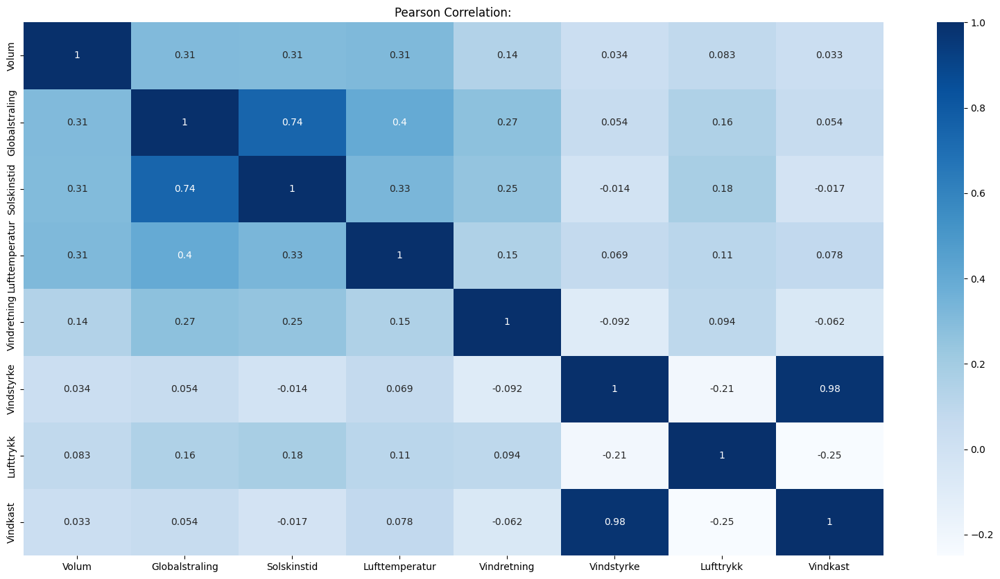

In [14]:
corr = all_data.corr()
plt.figure(figsize=(20, 10))
# Prepare the figure with data, title, and colour
sns.heatmap(corr, annot=True, cmap=plt.cm.Blues).set_title("Pearson Correlation:")
plt.show()

This shows us that the columns that volum is most correlated with global radiation, sunshine time, and air temperature. As global radiation is not directly felt, it is correct to drop this. We can also see that wind strength is almost perfectly correlated with wind gusts, so it is ok just to keep one. Same for sunshine time and global radiation. Both are strongly correlated, so we can keep the most relevant column.

In [15]:
# We can therefore discard the columns discussed earlier
all_data = all_data.drop(['Globalstraling', 'Vindretning', 'Lufttrykk', 'Vindkast'], axis=1)

Now, we can give a statistical overview of our columns.

In [16]:
# The describe method provides a statistical overview
all_data.describe()

,Volum,Solskinstid,Lufttemperatur,Vindstyrke
count,56387.000000,56387.000000,56106.000000,56107.000000
mean,52.643730,7.592344,8.704375,3.030926
std,71.782283,18.040701,5.809269,2.058970
min,0.000000,0.000000,-10.850000,0.000000
25%,6.000000,0.000000,4.400000,1.416667
50%,27.000000,0.000000,8.400000,2.600000
75%,67.000000,0.000000,12.900000,4.166667
max,711.000000,60.000000,31.833333,14.900000


Let's do a breakdown for each column:

As for volume, the mean seems logical, as 52 in an hour is not unexpected. The standard deviation is relatively high, so we need to bear that in mind when we predict. The minimum and percentile values are not that interesting, and the maximum value is high, but not unrealistic.

For sunshine time, a mean of 7.6 seems low, but is logical when you consider that this value is 0 during nighttime, and other factors such as cloud cover and rain. The standard deviation makes sense, as these factors mentioned above can change fairly quickly. The minimum value makes sense, as there are times when the sun doesn't shine at all, such as during nighttime. The percentile values don't stand out, but the maximum of 60 makes sense, as an hour has 60 minutes.

As for wind strength/speed, the mean seems to be logical, as 3.03 m/s corresponds with a light breeze on the Beaufort wind scale. The standard deviation does not seem to be out of the ordinary either. The minimum value is a bit unusual, as a wind speed of exactly 0 seems strange, but is possible nonetheless. The percentiles make sense as well, as they don't represent extreme winds either. The maximum of 14.9 m/s is quite a lot, classified as a near gale on the Beaufort wind scale. This is quite powerful, but this is a 5 year set, so it is certainly possible that there was a day where winds were quite strong.

To conclude, this data is quite dissimilar in terms of the scales, and the standard deviations. The standard deviation values differ even if you scale them. As a result, we need to be careful when we do imputation, as there may not be a one-size-fits-all. We will also need to scale our data, as the units are different. This should assist our model during prediction.

We can now visualise data for our weather conditions (comparing with the volum).

In [17]:
fig_traffic_data = {'Dato/Tid': all_data['Dato/Tid'], 'Volum': all_data['Volum']}
# Set axis values
fig_traffic = px.line(fig_traffic_data, x='Dato/Tid', y='Volum', title='Trafikkdata totalt')
fig_traffic.show()

In [18]:
# Plotly does not allow me to include units
fig_temp_data = {'Dato/Tid': all_data['Dato/Tid'], 'Lufttemperatur': all_data['Lufttemperatur']}
fig_temp = px.line(fig_temp_data, x='Dato/Tid', y='Lufttemperatur', title='Temperaturdata totalt')
# Change colour of line
fig_temp.update_traces(line_color='red')
fig_temp.show()


In [19]:
fig_wind_data = {'Dato/Tid': all_data['Dato/Tid'], 'Vindstyrke': all_data['Vindstyrke']}
fig_wind = px.line(fig_wind_data, x='Dato/Tid', y='Vindstyrke', title='Vindstyrkedata totalt')
fig_wind.update_traces(line_color='purple')
fig_wind.show()

In [20]:
fig_sun_data = {'Dato/Tid': all_data['Dato/Tid'], 'Solskinstid': all_data['Solskinstid']}
fig_sun = px.line(fig_sun_data, x='Dato/Tid', y='Solskinstid', title='Solskinstid totalt')
fig_sun.update_traces(line_color='orange')
fig_sun.show()

Looking at the initial traffic data from above (for all years), we can observe that it appears to peak during spring and autumn. It is the lowest during winter. This already hints that people don't cycle during winter due to the cold/slippery conditions, as can be seen by the temperature graph. Also, there is no dip in 2021/22 for volum, implying that COVID didn't really affect the rates of cycling (which makes sense, as we didn't have any major lockdowns). For this reason (and the fact that years are not periodical), I won't include dummy variables for the years.

All of this tells us that we should try to look at the years individually for both weather and traffic, as this is a very large sample size. The weather data is also very dense.
The wind data and the sunshine data are too dense to make conclusions from.

In [21]:
# ad = all data
ad2016 = all_data[(all_data['Dato/Tid'] >= '2016-1-1') & (all_data['Dato/Tid'] < '2017-1-1')]
fig2016data = {'Dato/Tid': ad2016['Dato/Tid'], 'Volum': ad2016['Volum']}
fig2016 = px.line(fig2016data, x='Dato/Tid', y='Volum', title='Trafikkdata 2016')

fig2016.show()

In [22]:
fig2016_tempdata = {'Dato/Tid': ad2016['Dato/Tid'], 'Lufttemperatur': ad2016['Lufttemperatur']}
fig_temp2016 = px.line(fig2016_tempdata, x='Dato/Tid', y='Lufttemperatur', title='Temperaturdata 2016')
fig_temp2016.update_traces(line_color='red')
fig_temp2016.show()

In [23]:
fig_wind2016_data = {'Dato/Tid': ad2016['Dato/Tid'], 'Vindstyrke': ad2016['Vindstyrke']}
fig_wind2016 = px.line(fig_wind2016_data, x='Dato/Tid', y='Vindstyrke', title='Vindstyrkedata 2016')
fig_wind2016.update_traces(line_color='purple')
fig_wind2016.show()

In [24]:
fig_sun2016_data = {'Dato/Tid': ad2016['Dato/Tid'], 'Solskinstid': ad2016['Solskinstid']}
fig_sun2016 = px.line(fig_sun2016_data, x='Dato/Tid', y='Solskinstid', title='Solskinstid 2016')
fig_sun2016.update_traces(line_color='orange')
fig_sun2016.show()

The data above is a sample from 2016, which shows the daily cycling rates. What's interesting about this is the rapid spikes in various months. Weather/time of day may have a part to play in this, so we will have to look at the weather data from a narrower timeframe, such as the same week/day.
What's also interesting, however, is the dip during July/August. If we look at the graphs for all years, we can see that this trend persists throughout all years. 
As for the temperature, it is still not easy to tell. However, there is a major temperature dip in early November, and it can be seen that the volume of bikes also declines slightly in that time. The wind data still doesn't tell much. Maybe that is because wind is not seasonal here. The sunshine data is more telling. It seems to be denser during summer and thinner during winter. This makes sense, as it becomes darker sooner during winter.

In [25]:
ad2016_05 = ad2016[(ad2016['Dato/Tid'] >= '2016-05-01') & (ad2016['Dato/Tid'] < '2016-05-15')]
fig2016_05_data = {'Dato/Tid': ad2016_05['Dato/Tid'], 'Volum': ad2016_05['Volum']}
fig2016_05 = px.line(fig2016_05_data, x='Dato/Tid', y='Volum', title='Trafikkdata 01/05/2016 - 14/05/2016')
fig2016_05.show()

In [26]:
fig2016_05_w1data_temp = {'Dato/Tid': ad2016_05['Dato/Tid'], 'Lufttemperatur': ad2016_05['Lufttemperatur']}
fig2016_05_temp = px.line(fig2016_05_w1data_temp, x='Dato/Tid', y='Lufttemperatur', title='Værdata 01/05/2016 - 14/05/2016')
fig2016_05_temp.update_traces(line_color='red')
fig2016_05_temp.show()

In [27]:
fig2016_05_winddata = {'Dato/Tid': ad2016_05['Dato/Tid'], 'Vindstyrke': ad2016_05['Vindstyrke']}
fig2016_05_wind = px.line(fig2016_05_winddata, x='Dato/Tid', y='Vindstyrke', title='Vindstyrke 01/05/2016 - 14/05/2016')
fig2016_05_wind.update_traces(line_color='purple')
fig2016_05_wind.show()

In [28]:
fig2016_05_sundata = {'Dato/Tid': ad2016_05['Dato/Tid'], 'Solskinstid': ad2016_05['Solskinstid']}
fig2016_05_sun = px.line(fig2016_05_sundata, x='Dato/Tid', y='Solskinstid', title='Solskinstid 01/05/2016 - 14/05/2016')
fig2016_05_sun.update_traces(line_color='orange')
fig2016_05_sun.show()

The above is a sample of the first two weeks in May 2016 (arbitrarily chosen). By looking at the spikes, we can see that they peak during daytime and decline during nighttime. This seems to largely explain these spikes, as people (logically) don't tend to bike during nighttime. This tells us that the time is also key in bike volume.

The temperature also climbs in the second week, which seems to correlate with the volume. The wind speed also dips during that time, while the sunshine time also peaks during that time.
All of this may be coincidental, but they do appear to correlate in this instance, so it makes sense to pick these variables in order to construct our model. Bear in mind, sunshine time may also correlate with precipitation.

## Feature selection/extraction

Before splitting our data, we would like to do feature selection, which will assist our model in its prediction. Dummy variables would be ideal.. Dummy variables are a column holding only values of 0 or 1 based off of values in another column. So, if we had a dummy column for the month August, all values in the dataframe that fall in August would have a value of 1 in this dummy column. Otherwise, this value is 0. Using these columns will assist our model in prediction.
 
We can start by extracting individual date and time columns. We won't include the week, as we are giving a date. It would also make the dataframe very large. As for the weather data, it is difficult to extract features for this, as there is nothing that emerges. I did mention that there may be an inverse relationship between sunshine time and precipitation, but this isn't certain. A low sunshine time can also imply darkness or cloudy conditions.

In [29]:
# Years are not periodical, so we won't include them
# We can call on the inbuilt datetime object dt
all_data['Måned'] = all_data['Dato/Tid'].dt.month
all_data['Dag'] = all_data['Dato/Tid'].dt.day
all_data['Ukedag'] = all_data['Dato/Tid'].dt.weekday
all_data['Time'] = all_data['Dato/Tid'].dt.hour

We want to do the same for the target data.

In [30]:
target_2022['Måned'] = target_2022['Dato/Tid'].dt.month
target_2022['Dag'] = target_2022['Dato/Tid'].dt.day
target_2022['Ukedag'] = target_2022['Dato/Tid'].dt.weekday
target_2022['Time'] = target_2022['Dato/Tid'].dt.hour

C:\Users\kavya\AppData\Local\Temp\ipykernel_69416\4092667898.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kavya\AppData\Local\Temp\ipykernel_69416\4092667898.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kavya\AppData\Local\Temp\ipykernel_69416\4092667898.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

In [31]:
# Creating dummy variables via the get_dummies method of pandas
dummy_time = pd.get_dummies(all_data[['Måned', 'Ukedag', 'Time']].astype(str))
all_data = pd.concat([all_data, dummy_time], axis=1)
all_data

,Dato/Tid,Volum,Solskinstid,Lufttemperatur,Vindstyrke,Måned,Dag,Ukedag,Time,Måned_1,...,Time_21,Time_22,Time_23,Time_3,Time_4,Time_5,Time_6,Time_7,Time_8,Time_9
0,2015-07-16 16:00:00,107,48.7,13.733333,4.333333,7,16,3,16,0,...,0,0,0,0,0,0,0,0,0,0
1,2015-07-16 17:00:00,84,60.0,13.866667,3.933333,7,16,3,17,0,...,0,0,0,0,0,0,0,0,0,0
2,2015-07-16 18:00:00,57,60.0,13.216667,4.233333,7,16,3,18,0,...,0,0,0,0,0,0,0,0,0,0
3,2015-07-16 19:00:00,49,60.0,12.683333,2.950000,7,16,3,19,0,...,0,0,0,0,0,0,0,0,0,0
4,2015-07-16 20:00:00,45,36.0,12.066667,2.483333,7,16,3,20,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56382,2021-12-31 18:00:00,5,0.0,6.483333,0.466667,12,31,4,18,0,...,0,0,0,0,0,0,0,0,0,0
56383,2021-12-31 19:00:00,4,0.0,5.616667,2.650000,12,31,4,19,0,...,0,0,0,0,0,0,0,0,0,0
56384,2021-12-31 20:00:00,2,0.0,4.700000,1.916667,12,31,4,20,0,...,0,0,0,0,0,0,0,0,0,0
56385,2021-12-31 21:00:00,5,0.0,4.233333,1.733333,12,31,4,21,0,...,1,0,0,0,0,0,0,0,0,0


In [32]:
# Do the same for the target data
dummy_time_target = pd.get_dummies(target_2022[['Måned', 'Ukedag', 'Time']].astype(str))
target_2022 = pd.concat([target_2022, dummy_time_target], axis=1)

## Splitting data

We can now split our dataframe into training, validation, and test data. We can do an 80/10/10 split respectively, which is common.

Training data is used to fit our model, validation data is used to pick out a model, and test data is used to give an evaluation of the best model.

In [33]:
# The train_test_split function splits the data into training and test data, so we can call it twice to split it three ways and obtain validation data
data_train, data_valtest = train_test_split(all_data, test_size=0.2)
data_val, data_test = train_test_split(data_valtest, test_size=0.5)

# Make sure the values are correctly sorted
data_train = data_train.sort_index()
data_val = data_val.sort_index()
data_test = data_test.sort_index()
data_train

,Dato/Tid,Volum,Solskinstid,Lufttemperatur,Vindstyrke,Måned,Dag,Ukedag,Time,Måned_1,...,Time_21,Time_22,Time_23,Time_3,Time_4,Time_5,Time_6,Time_7,Time_8,Time_9
1,2015-07-16 17:00:00,84,60.0,13.866667,3.933333,7,16,3,17,0,...,0,0,0,0,0,0,0,0,0,0
2,2015-07-16 18:00:00,57,60.0,13.216667,4.233333,7,16,3,18,0,...,0,0,0,0,0,0,0,0,0,0
3,2015-07-16 19:00:00,49,60.0,12.683333,2.950000,7,16,3,19,0,...,0,0,0,0,0,0,0,0,0,0
4,2015-07-16 20:00:00,45,36.0,12.066667,2.483333,7,16,3,20,0,...,0,0,0,0,0,0,0,0,0,0
5,2015-07-16 21:00:00,25,0.0,11.350000,1.083333,7,16,3,21,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56380,2021-12-31 16:00:00,7,0.0,6.600000,1.033333,12,31,4,16,0,...,0,0,0,0,0,0,0,0,0,0
56382,2021-12-31 18:00:00,5,0.0,6.483333,0.466667,12,31,4,18,0,...,0,0,0,0,0,0,0,0,0,0
56383,2021-12-31 19:00:00,4,0.0,5.616667,2.650000,12,31,4,19,0,...,0,0,0,0,0,0,0,0,0,0
56384,2021-12-31 20:00:00,2,0.0,4.700000,1.916667,12,31,4,20,0,...,0,0,0,0,0,0,0,0,0,0


## Saving data for modelling

Finally, our data is ready for modelling. Now, we save all of this into a csv file so that we can use it for modelling.

In [34]:
# To be used in model.ipynb
# We set index as false, so we don't have two indices
data_train.to_csv('data_train.csv', index=False)
data_val.to_csv('data_val.csv', index=False)
data_test.to_csv('data_test.csv', index=False)

target_2022.to_csv('target_2022.csv', index=False)